# Integrantes



*   Adrián Landaverde Nava
*   Cristian Gonzaga López
*   Sabrina Nicole Rodriguez Salgado
*   Naomi Padilla Mora



# 01. Librerías

In [ ]:
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation 
import numpy as np

In [ ]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# 02. Condiciones iniciales

In [ ]:
L1 = 1
L2 = 1
m1 = 1
m2 = 1
g = 9.81

# 03. Solución del sistema

In [ ]:
def deriv(y, t, L1, L2, m1, m2):
    """
    El sistema regresa las 4 soluciones para theta1, theta1dot, theta2, theta3dot en un array y
    """
    theta1, theta1dot, theta2, theta2dot = y 
    ## Aquí abajo escribe el sistema en z1 y z2
    sin_th1 = np.sin(theta1) # Seno de theta1.
    cos_th1 = np.cos(theta1) # Coseno de theta1.

    sin_diff = np.sin(theta1 - theta2) # Seno de theta 1 - theta2
    sin_diff_th1_2th2 = np.sin(theta1 - 2*theta2) # Seno de theta1 - 2 * theta2

    cos_diff = np.cos(theta1 - theta2) # Coseno de theta 1 - theta 2

    num_z1dot = g*(2*m1+m2)*sin_th1 + g*m2*sin_diff_th1_2th2 + 2*m2*(L2*pow(theta2dot,2) + L1*pow(theta1dot,2)* cos_diff)*sin_diff # Numerador de z1dot
    den_z1dot = 2*L1*(m1 + m2 - m2*pow(cos_diff,2)) # Denominador de z1dot

    num_z2dot = (L1*(m1+m2)*pow(theta1dot,2)+ g*(m1+m2)*cos_th1 + L2*m2*pow(theta2dot,2)*cos_diff) * sin_diff # Numerador de z2dot
    den_z2dot = L2*(m1+m2-m2*pow(cos_diff,2)) # Denominador de z2dot


    z1dot = - num_z1dot / den_z1dot
    z2dot = num_z2dot / den_z2dot
    theta1dotdot = z1dot
    theta2dotdot = z2dot

    return theta1dot, theta1dotdot, theta2dot, theta2dotdot

# 04. Simulación de una situación caótica

Se obtiene una situación caótica si se considera un conjunto de péndulos, cada uno con condiciones iniciales ligeramente diferentes.

In [ ]:
# time frame
tmax = 20
dt = 0.04
t = np.arange(0, tmax+dt, dt)

# número de péndulos
############### Fijar el número de péndulos que se quieren usar (por ejemplo 100)
npend = 100

# Range of initial conditions, only slightly different
frac    = 0.00001
theta10 = 3*np.pi/7
theta20 = 3*np.pi/4
### Aquí se ponen como condiciones iniciales condiciones ligeramente diferentes para cada péndulo
y0i = [ np.array([theta10,0,theta20+i*theta20*frac,0]) for i in range(npend) ]


In [ ]:
gradiente=cm.get_cmap('cool',npend)
print(gradiente(1/npend))

(0.010101010101010102, 0.98989898989899, 1.0, 1.0)


In [ ]:
y0i

[array([1.34639685, 0.        , 2.35619449, 0.        ]),
 array([1.34639685, 0.        , 2.35621805, 0.        ]),
 array([1.34639685, 0.        , 2.35624161, 0.        ]),
 array([1.34639685, 0.        , 2.35626518, 0.        ]),
 array([1.34639685, 0.        , 2.35628874, 0.        ]),
 array([1.34639685, 0.        , 2.3563123 , 0.        ]),
 array([1.34639685, 0.        , 2.35633586, 0.        ]),
 array([1.34639685, 0.        , 2.35635942, 0.        ]),
 array([1.34639685, 0.        , 2.35638299, 0.        ]),
 array([1.34639685, 0.        , 2.35640655, 0.        ]),
 array([1.34639685, 0.        , 2.35643011, 0.        ]),
 array([1.34639685, 0.        , 2.35645367, 0.        ]),
 array([1.34639685, 0.        , 2.35647723, 0.        ]),
 array([1.34639685, 0.        , 2.3565008 , 0.        ]),
 array([1.34639685, 0.        , 2.35652436, 0.        ]),
 array([1.34639685, 0.        , 2.35654792, 0.        ]),
 array([1.34639685, 0.        , 2.35657148, 0.        ]),
 array([1.3463

In [ ]:
### Usando odeint, calcula una solución "yi" para cada péndulo y cada condición inicial y0i
## El resultado es una lista de 100 arrays, cada uno con los valores y de la solución de cada péndulo
yi=[] 
for i in range(npend):
  yi.append(odeint(deriv, y0i[i], t, args=(L1, L2, m1, m2)))

yi

[array([[ 1.34639685,  0.        ,  2.35619449,  0.        ],
        [ 1.3392127 , -0.35876386,  2.35444559, -0.08876575],
        [ 1.31776647, -0.71222685,  2.34888301, -0.1932791 ],
        ...,
        [ 0.11968549,  4.51116808,  4.97459443,  2.34185134],
        [ 0.29431982,  4.19318508,  5.09195692,  3.50635981],
        [ 0.45255565,  3.6826839 ,  5.25313958,  4.52457816]]),
 array([[ 1.34639685,  0.        ,  2.35621805,  0.        ],
        [ 1.33921268, -0.35876468,  2.35446915, -0.08876598],
        [ 1.3177664 , -0.71222864,  2.34890656, -0.19327962],
        ...,
        [ 0.88901478, -4.24408622, 32.12942366,  9.29189639],
        [ 0.71397875, -4.13697773, 32.50043241,  8.81695951],
        [ 0.57113681, -3.01633859, 32.82087015,  7.25268428]]),
 array([[ 1.34639685,  0.        ,  2.35624161,  0.        ],
        [ 1.33921267, -0.35876551,  2.35449271, -0.0887662 ],
        [ 1.31776634, -0.71223043,  2.3489301 , -0.19328015],
        ...,
        [-0.45909934,  5.63

In [ ]:
# Usando las soluciones de las ecuaciones, calcular las coordenadas cartesianas para todos los péndulos
## (hay que iterar sobre el número de péndulos)

theta1=[]
theta2=[]
for i in range(npend):
  thetas = yi[i][:,0], yi[i][:,2]
  theta1.append(thetas[0])
  theta2.append(thetas[1])

x1 = L1*np.sin(theta1)
y1 = -L1*np.cos(theta1)

x2 = L1*np.sin(theta1) + L1*np.sin(theta2)
y2 = -L1*np.cos(theta1) - L2*np.cos(theta2)

x1

array([[ 0.97492791,  0.97330414,  0.96815838, ...,  0.11939995,
         0.29008899,  0.43726534],
       [ 0.97492791,  0.97330414,  0.96815836, ...,  0.77645126,
         0.65484593,  0.54058878],
       [ 0.97492791,  0.97330414,  0.96815834, ..., -0.44314089,
        -0.20372493,  0.10401454],
       ...,
       [ 0.97492791,  0.97330378,  0.96815673, ...,  0.74104335,
         0.67145219,  0.59324649],
       [ 0.97492791,  0.97330378,  0.96815671, ..., -0.90405541,
        -0.90243308, -0.89454536],
       [ 0.97492791,  0.97330377,  0.96815669, ..., -0.95744964,
        -0.98468456, -0.99482494]])

# 05. Graficación de variables de 2 péndulos

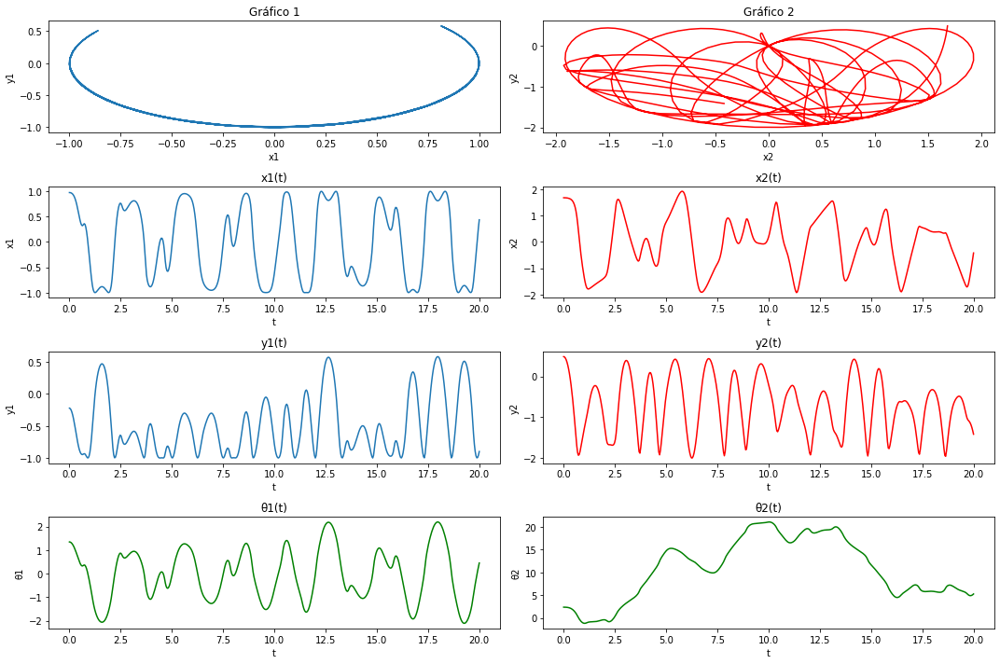

In [ ]:
fig, axs = plt.subplots(nrows=4, ncols=2)

# plots
# Objeto 1
axs[0,0].plot(x1[0],y1[0])
axs[0,0].set_xlabel("x1")
axs[0,0].set_ylabel("y1")
axs[0,0].set_title('Gráfico 1')

axs[1,0].plot(t,x1[0])
axs[1,0].set_xlabel("t")
axs[1,0].set_ylabel("x1")
axs[1,0].set_title('x1(t)')

axs[2,0].plot(t,y1[0])
axs[2,0].set_xlabel("t")
axs[2,0].set_ylabel("y1")
axs[2,0].set_title('y1(t)')

# Objeto 2
axs[0,1].plot(x2[0],y2[0],color = "r")
axs[0,1].set_xlabel("x2")
axs[0,1].set_ylabel("y2")
axs[0,1].set_title('Gráfico 2')

axs[1,1].plot(t,x2[0],color = "r")
axs[1,1].set_xlabel("t")
axs[1,1].set_ylabel("x2")
axs[1,1].set_title('x2(t)')

axs[2,1].plot(t,y2[0],color = "r")
axs[2,1].set_xlabel("t")
axs[2,1].set_ylabel("y2")
axs[2,1].set_title('y2(t)')

# Ángulos en función del tiempo
axs[3,0].plot(t,theta1[0],color = "g")
axs[3,0].set_xlabel("t")
axs[3,0].set_ylabel("θ1")
axs[3,0].set_title('θ1(t)')

axs[3,1].plot(t,theta2[0],color = "g")
axs[3,1].set_xlabel("t")
axs[3,1].set_ylabel("θ2")
axs[3,1].set_title('θ2(t)')

fig.set_size_inches(15, 10)
fig.tight_layout()

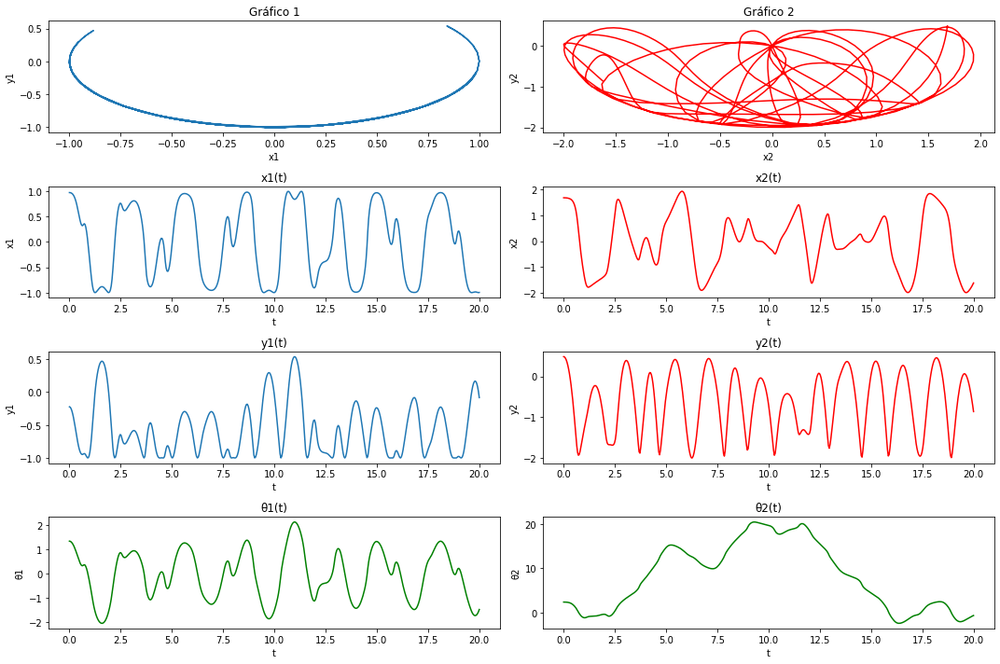

In [ ]:
fig, axs = plt.subplots(nrows=4, ncols=2)

# plots
# Objeto 1
axs[0,0].plot(x1[4],y1[4])
axs[0,0].set_xlabel("x1")
axs[0,0].set_ylabel("y1")
axs[0,0].set_title('Gráfico 1')

axs[1,0].plot(t,x1[4])
axs[1,0].set_xlabel("t")
axs[1,0].set_ylabel("x1")
axs[1,0].set_title('x1(t)')

axs[2,0].plot(t,y1[4])
axs[2,0].set_xlabel("t")
axs[2,0].set_ylabel("y1")
axs[2,0].set_title('y1(t)')

# Objeto 2
axs[0,1].plot(x2[4],y2[4],color = "r")
axs[0,1].set_xlabel("x2")
axs[0,1].set_ylabel("y2")
axs[0,1].set_title('Gráfico 2')

axs[1,1].plot(t,x2[4],color = "r")
axs[1,1].set_xlabel("t")
axs[1,1].set_ylabel("x2")
axs[1,1].set_title('x2(t)')

axs[2,1].plot(t,y2[4],color = "r")
axs[2,1].set_xlabel("t")
axs[2,1].set_ylabel("y2")
axs[2,1].set_title('y2(t)')

# Ángulos en función del tiempo
axs[3,0].plot(t,theta1[4],color = "g")
axs[3,0].set_xlabel("t")
axs[3,0].set_ylabel("θ1")
axs[3,0].set_title('θ1(t)')

axs[3,1].plot(t,theta2[4],color = "g")
axs[3,1].set_xlabel("t")
axs[3,1].set_ylabel("θ2")
axs[3,1].set_title('θ2(t)')

fig.set_size_inches(15, 10)
fig.tight_layout()

# 06. Preparación de la simulación

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Saw kwargs ['lw', 'linewidth'] which are all aliases for 'linewidth'.  Kept value from 'linewidth'.  Passing multiple aliases for the same property will raise a TypeError in 3.3.


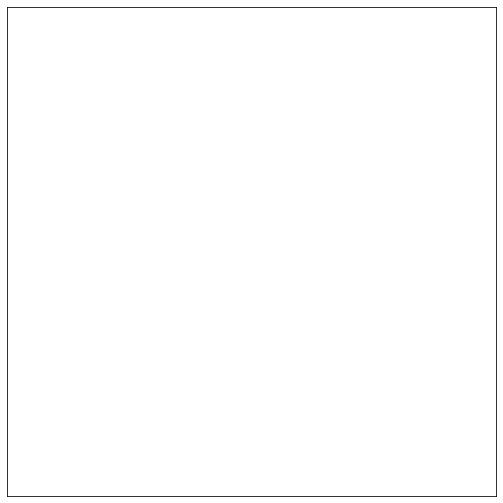

In [ ]:
i = 50 #Puedes cambiar ese número para visualizar otro momento 

r = 0.25
ns = 20
trail_secs = 1

fig = plt.figure(figsize=(9, 9), dpi=72)
ax = fig.add_subplot(111)

## Se repite lo que hiciste para representar un momento i del movimiento, pero creando
# plot "vacíos" para usarlos en la animación para generar un plot por cada momento i

# Dibuja el punto donde se cuelga el péndulo (igual como hiciste arriba)
c0 = ax.plot(0,0,'k')

# barras del péndulo
lineas=[]
for j in range(npend):
  lines, = ax.plot([], [], lw=2, c='k',linewidth=0.5)
  lineas.append(lines)

# masas
c1s=[]
c2s=[]
for j in range(npend):
  c1, = ax.plot([],[],'o',markersize=3,color='black')
  c2, = ax.plot([],[],'o',markersize=10,c=gradiente(j/(npend-1)))
  c1s.append(c1)
  c2s.append(c2)

# m2 trail


ax.set_xlim(-L1-L2-r, L1+L2+r)
ax.set_ylim(-L1-L2-r, L1+L2+r)
ax.set_aspect('equal', adjustable='box')
#plt.axis('off')
plt.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
plt.show()

In [ ]:
import networkx as nx
from matplotlib.animation import FuncAnimation, FFMpegWriter,  PillowWriter 
%matplotlib inline
from IPython.display import HTML, Image

def pendolum_init():
    lines.set_data([], [])
    return (lines,)


### Modificar aquí:
def pendolum_animate(i):
    ## En lines.set_data() poner las coordenadas para dibujar las barras del péndulo
    #lines.set_data([0, x1[i], x2[i]], [0,y1[i],y2[i]])
    ## En c1.set_data() poner las coordenadas para dibujar la masa 1
    ## En c2.set_data() poner las coordenadas para dibujar la masa 2
    #c1.set_data() 
    #c2.set_data() 
    for j in range(npend):
      c1s[j].set_data(x1[j][i],y1[j][i])
      c2s[j].set_data(x2[j][i],y2[j][i]) 
      lineas[j].set_data([0, x1[j][i], x2[j][i]], [0,y1[j][i],y2[j][i]])


    return (lines,)

anim = FuncAnimation(fig,pendolum_animate,frames=range(len(x1[0])),init_func=pendolum_init,blit=True)

# 07. Simulación

In [ ]:
HTML(anim.to_html5_video())